In [1]:
# NOTE FOR LOCAL EXECUTION: use pytorch kernel and execute the code below to specify cuda device
import os
os.environ["CUDA_VISIBLE_DEVICES"]="0"

# BERT and Explainable AI

## Load required libraries

In [2]:
!pip install pandas
!pip install transformers
!pip install transformers-interpret

## Import libraries

In [1]:
from utils import *
import pandas as pd
import pickle
from transformers import AutoModelForSequenceClassification, AutoTokenizer
from transformers_interpret import SequenceClassificationExplainer

c:\Users\david\OneDrive - Universitat de Barcelona\GitHub\New explainability implementation\mbti\non_masked\FT\utils.py:10: FutureWarning: load_metric is deprecated and will be removed in the next major version of datasets. Use 'evaluate.load' instead, from the new library 🤗 Evaluate: https://huggingface.co/docs/evaluate
  auc_metric = load_metric("roc_auc", trust_remote_code=True)


## Load data

In [3]:
# Original data
#df = pd.read_csv(r"C:\Users\david\OneDrive - Universitat de Barcelona (1)\Documentos\GitHub\Explainability\essays.csv", encoding = "latin-1")

# Alternatively, load fragmented validation and test partitions
df_train = pd.read_csv(r"C:\Users\david\OneDrive - Universitat de Barcelona\GitHub\New explainability implementation\datasets\df_mbti_fragm_train.csv")
df_valid = pd.read_csv(r"C:\Users\david\OneDrive - Universitat de Barcelona\GitHub\New explainability implementation\datasets\df_mbti_fragm_valid.csv")
df_test = pd.read_csv(r"C:\Users\david\OneDrive - Universitat de Barcelona\GitHub\New explainability implementation\datasets\df_mbti_fragm_test.csv")
#df = pd.concat([df_valid, df_test], axis=0, ignore_index=True)
df = df_test

df.head()

,type,text,I/E,N/S,F/T,J/P,masked_text_bert,num_replacements,masked_text_roberta,random_masked_text_bert,random_masked_text_roberta
0,INFP,"they sleep, but yeah. How long do you think yo...",1,1,1,0,"they sleep, but yeah. How long do you think yo...",0,"they sleep, but yeah. How long do you think yo...","they sleep, but yeah. How long do you think yo...","they sleep, but yeah. How long do you think yo..."
1,INFJ,conflict earlier today in school. I stood up f...,1,1,1,1,conflict earlier today in school. I stood up f...,0,conflict earlier today in school. I stood up f...,conflict earlier today in school. I stood [UNK...,conflict earlier today in school. I stood up f...
2,INTJ,is the interesting one. Assume that everyone i...,1,1,0,1,is the interesting one. Assume that everyone i...,0,is the interesting one. Assume that everyone i...,is the interesting one. Assume that everyone i...,is the interesting one. Assume that everyone i...
3,INFJ,experience and now I'm forever traumatized.|||...,1,1,1,1,experience and now I'm forever traumatized.|||...,1,experience and now I'm forever traumatized.|||...,experience and now I'm forever traumatized.|||...,experience and now I'm forever traumatized.|||...
4,ENTP,I can respect that. I'd take an INFP any day o...,0,1,0,0,I can respect that. I'd take an [UNK] any day ...,8,I can respect that. I'd take an <unk> any day ...,I can respect that. I'd take an INFP any day o...,I can respect that. I'd take an INFP <unk> day...


In [5]:
print(len(df))

4416


## Notebook Settings

In [4]:
trait = "F/T"
text_colname="text"

## Load the fine-tuned model

In [5]:
# Path to the fine-tuned model
#model_path = r"C:\Users\david\OneDrive - Universitat de Barcelona (1)\Documentos\GitHub\Explainability\Agreeableness\results_agreeableness"  # my laptop
model_path = r"C:\Users\david\OneDrive - Universitat de Barcelona\GitHub\New explainability implementation\fine_tuning_models\results_mbti_ft_fragm_256"

# Load the fine-tuned model and tokenizer
model_name = "bert-base-uncased"
#model_name = "FacebookAI/roberta-base"
tokenizer = AutoTokenizer.from_pretrained(model_name, do_lower_case=True)
#tokenizer = getTokenizer(model_name)
fine_tuned_model = AutoModelForSequenceClassification.from_pretrained(model_path)
cls_explainer = SequenceClassificationExplainer(fine_tuned_model, tokenizer)

  0%|          | 0/552 [00:00<?, ?it/s]

{'eval_loss': 0.4023614823818207, 'eval_accuracy': 0.8179347826086957, 'eval_roc_auc': 0.8160155062328975, 'eval_conf_matrix': array([[1605,  419],
       [ 385, 2007]], dtype=int64), 'eval_runtime': 366.3736, 'eval_samples_per_second': 12.053, 'eval_steps_per_second': 1.507}


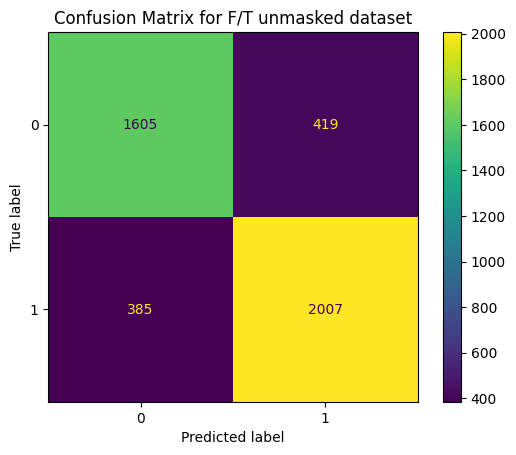

In [7]:
# Check that the model is correct

# Create datasets
X_train, X_valid, y_train, y_valid = create_partition_from_split(df_train, df_valid, text_colname, trait)
_, X_test, _, y_test = create_partition_from_split(df_train, df_test, text_colname, trait)
train_dataset, valid_dataset = create_datasets(tokenizer, X_train, X_valid, y_train, y_valid)
_, test_dataset = create_datasets(tokenizer, X_train, X_test, y_train, y_test)

# Create trainer
trainer = Trainer(
        model=fine_tuned_model,          # the instantiated Transformers model to be trained
        args=None,                       # training arguments
        train_dataset=train_dataset,     # training dataset
        eval_dataset=test_dataset,      # evaluation dataset
        compute_metrics=compute_metrics, # the callback that computes metrics of interest
        #optimizers=(optimizer, None)
    )

results = trainer.evaluate()
conf_matrix = results['eval_conf_matrix']
print(results)
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix)
disp.plot()

# Add a title to the confusion matrix plot
plt.title("Confusion Matrix for F/T unmasked dataset")
plt.show()

In [9]:
import pickle

# Set the desired maximum sequence length
max_sequence_length = 450
attribution_threshold = 0.8  # Adjust the threshold as needed

# List to store word attributions for each row
all_word_attributions = []

# List to store sum of attributions for each row
all_sum_attributions = []

# Loop through all rows in the dataset
print("Number of rows:", len(df))
for row_index in range(len(df)):
#for row_index in range(600, 700):
    # Show progress every 100 sentences
    if row_index%100 == 0:
        print(row_index)
        
    preproc_text = get_preproc_text(df, row_index, tokenizer, 
                                    max_sequence_length, text_colname=text_colname)
    word_attributions = cls_explainer(preproc_text)
    true_class = df.loc[row_index, trait]
    predicted_class = cls_explainer.predicted_class_name

    # Print the terms with scores greater than the threshold
    for token, score in word_attributions:
        if abs(score) > attribution_threshold:
            print(f'Token: {token}, Score: {score}')

    # Save the filtered attributions for this row along with true_class and predicted_class
    attribution_info = (word_attributions, true_class, predicted_class)
    all_word_attributions.append(attribution_info)

    # Visualize if there are filtered attributions
    if any(abs(score) > attribution_threshold for _, score in word_attributions):
        cls_explainer.visualize(true_class=true_class)
    
    # Sum of attributions for the entire text
    sum_attribution = cls_explainer.attributions.attributions_sum.sum()

    # Save the sum of attributions for this row
    all_sum_attributions.append((sum_attribution.item(), true_class, predicted_class))
    
# Save all_word_attributions to a file
word_attr_fname = get_all_word_attr_fname_mbti(trait)
with open(word_attr_fname, 'wb') as file:
    pickle.dump(all_word_attributions, file)

# Save all_sum_attributions to a file
sum_attr_fname = get_all_sum_attr_fname_mbti(trait)
with open(sum_attr_fname, 'wb') as file:
    pickle.dump(all_sum_attributions, file)

Number of rows: 4416
0
Token: ##fp, Score: 0.8847961859593808


100
Token: ##fp, Score: 0.8419824450507916


Token: ##fp, Score: 0.8180720591650477


Token: ##fp, Score: 0.8248643418315428


Token: ,, Score: 0.8005176834295438


Token: ##fp, Score: 0.8346575465476819


Token: ##fp, Score: 0.8369484217168073


200
Token: ##fp, Score: 0.8325841007123126


Token indices sequence length is longer than the specified maximum sequence length for this model (548 > 512). Running this sequence through the model will result in indexing errors


Token: fellow, Score: 0.8080109431070719


300
Token: ##fp, Score: 0.8161040329267554


Token: fellow, Score: 0.8416397788972309


400
Token: ##tp, Score: 0.819588447776973


Token: int, Score: 0.8527196385378442


Token: we, Score: 0.8038595662944543


Token: ##fp, Score: 0.8806287266462398


Token: int, Score: 0.8363989798342885


500
Token: fellow, Score: 0.9154533332673972


Token: ##fp, Score: 0.965180625157859


Token: ##tp, Score: 0.8624916244764127


Token: ', Score: -0.843716681806377


600
Token: ##fp, Score: 0.9672871213489741


Token: ist, Score: 0.8458635428216649


Token: of, Score: 0.8157225858085577


700
Token: int, Score: 0.8098077333306163


Token: another, Score: 0.8672590819665138


800
Token: ##fp, Score: 0.8896000141347168


Token: for, Score: 0.8081416725473076


Token: ##fp, Score: 0.8288173312029565


900
1000
Token: ##fp, Score: 0.9068406192849146


Token: ##fp, Score: 0.8990490125692546


Token: ##fp, Score: 0.914270294493369


Token: ##fp, Score: 0.9045805580696061


Token: int, Score: 0.8395844350479873


1100
Token: ##fp, Score: 0.9093423091094789


Token: ,, Score: 0.8664635086634


Token: fellow, Score: 0.8975947243363974


1200
Token: ##fp, Score: 0.8331089398792039


Token: ##fp, Score: 0.8663878356657244


Token: ##fp, Score: 0.919185440343458


Token: ##fp, Score: 0.853870398917164


Token: ##fp, Score: 0.8006568187577879


1300
Token: nt, Score: 0.8855628515883021


Token: ##fp, Score: 0.939638087721574


Token: ist, Score: 0.8258533818943365


1400
Token: ##fp, Score: 0.8352448975316774


Token: ##fp, Score: 0.8981070825693023


Token: hs, Score: 0.9319759387055971


Token: ##fp, Score: 0.961254073556947


Token: int, Score: 0.8659701294663288


Token: spiritual, Score: 0.8391773297124597


Token: values, Score: -0.8019826845241215


1500
Token: ##tp, Score: 0.9256915450243958


Token: to, Score: 0.8278997869970286


Token: ##fp, Score: 0.9105393400801846


Token: ##fp, Score: 0.9092582949411813


1600
Token: ##fp, Score: 0.9058394100861705


Token: ##fp, Score: 0.9182886164545666


Token: ##fp, Score: 0.9334363293596222


1700
Token: ##fp, Score: 0.9215522460699507


Token: ##tp, Score: 0.8222174409744902


1800
Token: int, Score: 0.8626916202212885


Token: ', Score: 0.9021023151803961


Token: ##fp, Score: 0.8951649187496755


1900
2000
Token: ist, Score: 0.8607299654755001


Token: such, Score: 0.8366732959642621


Token: ##tp, Score: 0.8954947014731122


2100
Token: int, Score: 0.8559897220125392


Token: ', Score: 0.9332040796454943


Token: to, Score: 0.8857515462555283


Token: int, Score: 0.8027947879741228


Token: ##tp, Score: 0.8249599081283122


Token: ##fp, Score: 0.9065980609907822


2200
Token: for, Score: 0.9203273346001223


Token: ##fp, Score: 0.94645659908944


Token: like, Score: 0.8652828134619592


Token: int, Score: 0.8600776891858821


Token: of, Score: 0.8451206569396493


Token: this, Score: -0.8138131324190309


Token: int, Score: 0.8599366753513321


Token: ist, Score: 0.8080840228007312


2300
Token: the, Score: -0.9348129579885385


Token: ist, Score: 0.8012362322928519


Token: ##tp, Score: 0.9570572540022159


Token: int, Score: 0.8299517998280455


2400
Token: ##fp, Score: 0.9356188320953019


Token: other, Score: 0.8429678308138481


2500
Token: us, Score: 0.8898646614370574


Token: to, Score: 0.8472234489450546


2600
Token: ##tp, Score: 0.925505988221862


Token: ##tp, Score: 0.8421548586067896


Token: other, Score: 0.883349394360256


Token: ##fp, Score: 0.8635850700837452


2700
Token: nt, Score: 0.8509887282856137


Token: then, Score: -0.9171925525287505


Token: ##fp, Score: 0.814069198691383


Token: nt, Score: 0.8177667736550843


Token: ##fp, Score: 0.8778414357501724


Token: ##fp, Score: 0.8647599277560338


2800
Token: ##fp, Score: 0.9087023916497711


Token: ##fp, Score: 0.8543082922971269


2900
Token: int, Score: 0.8528788401001043


Token: us, Score: 0.9140985437417263


Token: ##fp, Score: 0.9541309509681267


Token: int, Score: 0.8926098306581266


Token: ist, Score: 0.820050894843906


Token: ##fp, Score: 0.9636905574021785


3000
Token: ##fp, Score: 0.8818334603659346


Token: ##fp, Score: 0.8591456440979307


Token: ##fp, Score: -0.8286309965236164


3100
Token: ##fp, Score: 0.8048124009319344


Token: ##fp, Score: 0.8691316766327349


Token: ##fp, Score: 0.92707540056793


Token: ##fp, Score: 0.834139251412478


3200
Token: fellow, Score: 0.9437176655658003


Token: ##fp, Score: 0.9255678820861784


Token: in, Score: -0.9103131947535946


Token: us, Score: 0.8054596417556863


3300
Token: ##tp, Score: 0.8519123303237612


3400
Token: ##fp, Score: -0.8329773896217486


Token: cannabis, Score: -0.8042772835636051


Token: ##fp, Score: 0.8366149994405384


Token: ##tp, Score: -0.8417459215951123


Token: ##fp, Score: 0.976444697336814


Token: int, Score: 0.8502003650968669


Token: us, Score: 0.8060656044515726


3500
Token: the, Score: 0.8325500304953302


Token: am, Score: 0.8203686112118519


Token: ##fp, Score: 0.8032033980736333


Token: ##fp, Score: 0.9374858436809388


3600
Token: another, Score: 0.8578932745886093


Token: smarter, Score: 0.8096114477146743


3700
Token: ##fp, Score: 0.9206307282198202


Token: ##fp, Score: 0.8983180349186631


Token: ., Score: 0.8688163760941237


Token: other, Score: 0.8129573600547775


3800
Token: ist, Score: 0.9035133524567012


Token: int, Score: 0.8220146059354984


Token: ##fp, Score: 0.8353718619879987


Token: to, Score: -0.8471779806296668


3900
Token: ##fp, Score: 0.8486479625218117


4000
Token: ##fp, Score: 0.9339741637716773


Token: nt, Score: 0.8784889957198263


Token: ', Score: 0.9221583307479349


Token: ##fp, Score: 0.9502148715609633


Token: think, Score: 0.9099509126541745


Token: ##fp, Score: 0.8633551413352559


Token: the, Score: 0.8015107131414924


4100
Token: ##tp, Score: 0.9053969534755657


Token: ##fp, Score: 0.8921063839495402


Token: am, Score: 0.8190943765332426


Token: ##tp, Score: 0.9573563870568325


4200
Token: int, Score: 0.9083744062638898


Token: ., Score: -0.80111191934839


4300
Token: ##fp, Score: 0.8909201560400187


Token: ##fp, Score: 0.9045302064732613


Token: ##tp, Score: -0.9024365299343868


Token: ##fp, Score: 0.9084993362059884


Token: ##fp, Score: 0.8925379563972223


4400


In [6]:
import pickle

word_attr_fname = get_all_word_attr_fname_mbti(trait)
sum_attr_fname = get_all_sum_attr_fname_mbti(trait)

# Load the previously saved attributions from the file
with open(word_attr_fname, 'rb') as file:
    all_word_attributions = pickle.load(file)

# Load the previously saved attributions from the file
with open(sum_attr_fname, 'rb') as file:
    all_sum_attributions = pickle.load(file)

## Obtain Word Frequencies 

In [7]:
word_freq = get_word_freqs(all_word_attributions)
word_freq_label_1 = get_word_freqs(all_word_attributions, "LABEL_1")
word_freq_label_0 = get_word_freqs(all_word_attributions, "LABEL_0")

## Obtain Positive and Negative Attributions

In [8]:
# Get positive and negative attributions for the two labels
force_correct_classif=False
positive_attributions_label_1 = filter_attributions(all_word_attributions, '+', "LABEL_1", force_correct_classif)
positive_attributions_label_0 = filter_attributions(all_word_attributions, '+', "LABEL_0", force_correct_classif)
negative_attributions_label_1 = filter_attributions(all_word_attributions, '-', "LABEL_1", force_correct_classif)
negative_attributions_label_0 = filter_attributions(all_word_attributions, '-', "LABEL_0", force_correct_classif)

## Word Filtering Functions

In [9]:
#!pip install nltk

import nltk
from nltk.corpus import stopwords

# Obtain stop words
nltk.download('stopwords')
english_stopwords = stopwords.words('english')
#print(english_stopwords)

# Obtain list of words
nltk.download('words')
english_words = set(nltk.corpus.words.words())
#print(len(english_words))

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\david\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package words to
[nltk_data]     C:\Users\david\AppData\Roaming\nltk_data...
[nltk_data]   Package words is already up-to-date!


## Word Clouds
### By attribution score

In [10]:
from wordcloud import WordCloud
from collections import Counter
import matplotlib.pyplot as plt

min_word_freq = 10
min_word_len = 2
english_words = None
sum_techniques = ["freq", "avg", "max", "accum", "gmean"]
#sum_techniques = ["avg"]

for sum_technique in sum_techniques:

    # Create separate lists for positive and negative attributions for LABEL_1
    filtered_words = filter_words(english_words, english_stopwords, word_freq_label_1, positive_attributions_label_1, min_word_freq, min_word_len, mbti_words)
    positive_words_label_1 = summarize_scores(filtered_words, sum_technique)
    filtered_words = filter_words(english_words, english_stopwords, word_freq_label_1, negative_attributions_label_1, min_word_freq, min_word_len, mbti_words)
    negative_words_label_1 = summarize_scores(filter_words(english_words, english_stopwords, word_freq, negative_attributions_label_1), sum_technique)

    # Create separate lists for positive and negative attributions for LABEL_0
    filtered_words = filter_words(english_words, english_stopwords, word_freq_label_0, positive_attributions_label_0, min_word_freq, min_word_len, mbti_words)
    positive_words_label_0 = summarize_scores(filtered_words, sum_technique)
    filtered_words = filter_words(english_words, english_stopwords, word_freq_label_0, negative_attributions_label_0, min_word_freq, min_word_len, mbti_words)
    negative_words_label_0 = summarize_scores(filtered_words, sum_technique)

    # Generate word clouds
    wordcloud_label_1_positive = WordCloud(background_color='white').generate_from_frequencies(positive_words_label_1)
    wordcloud_label_1_negative = WordCloud(background_color='white').generate_from_frequencies(negative_words_label_1)
    wordcloud_label_0_positive = WordCloud(background_color='white').generate_from_frequencies(positive_words_label_0)
    wordcloud_label_0_negative = WordCloud(background_color='white').generate_from_frequencies(negative_words_label_0)

    # Plot word clouds
    fig = plt.figure(figsize=(16, 8))

    plt.subplot(2, 2, 1)
    plt.imshow(wordcloud_label_1_positive, interpolation='bilinear')
    plt.title(trait + ": Word Cloud for Positive Attributions (LABEL_1) " + sum_technique)
    plt.axis('off')

    plt.subplot(2, 2, 2)
    plt.imshow(wordcloud_label_1_negative, interpolation='bilinear')
    plt.title(trait + ": Word Cloud for Negative Attributions (LABEL_1) " + sum_technique)
    plt.axis('off')

    plt.subplot(2, 2, 3)
    plt.imshow(wordcloud_label_0_positive, interpolation='bilinear')
    plt.title(trait + ": Word Cloud for Positive Attributions (LABEL_0) " + sum_technique)
    plt.axis('off')

    plt.subplot(2, 2, 4)
    plt.imshow(wordcloud_label_0_negative, interpolation='bilinear')
    plt.title(trait + ": Word Cloud for Negative Attributions (LABEL_0) " + sum_technique)
    plt.axis('off')

    plt.tight_layout()
    
    # Save the figure as a high-resolution image
    filename = f"wordclouds_FT_{sum_technique}.png"
    plt.savefig(filename, dpi=300, bbox_inches = "tight")
    plt.close(fig)

## Barplots

In [11]:
min_word_freq = 10
min_word_len = 2
sum_technique = "gmean"
# Create separate lists for positive and negative attributions for LABEL_1
filtered_words = filter_words(english_words, english_stopwords, word_freq_label_1, positive_attributions_label_1, min_word_freq, min_word_len, mbti_words)
positive_words_label_1 = summarize_scores(filtered_words, sum_technique)
filtered_words = filter_words(english_words, english_stopwords, word_freq_label_1, negative_attributions_label_1, min_word_freq, min_word_len, mbti_words)
negative_words_label_1 = summarize_scores(filter_words(english_words, english_stopwords, word_freq, negative_attributions_label_1), sum_technique)

# Create separate lists for positive and negative attributions for LABEL_0
filtered_words = filter_words(english_words, english_stopwords, word_freq_label_0, positive_attributions_label_0, min_word_freq, min_word_len, mbti_words)
positive_words_label_0 = summarize_scores(filtered_words, sum_technique)
filtered_words = filter_words(english_words, english_stopwords, word_freq_label_0, negative_attributions_label_0, min_word_freq, min_word_len, mbti_words)
negative_words_label_0 = summarize_scores(filtered_words, sum_technique)

# Plot horizontal bar plots for each category with both top and bottom significant words
plot_bar(positive_words_label_1, 'Positive Attributions (LABEL_1)', filename = "positive_label_1_barplot.png")
plot_bar(negative_words_label_1, 'Negative Attributions (LABEL_1)', filename = "negative_label_1_barplot.png")
plot_bar(positive_words_label_0, 'Positive Attributions (LABEL_0)', filename = "positive_label_0_barplot.png")
plot_bar(negative_words_label_0, 'Negative Attributions (LABEL_0)', filename = "negative_label_0_barplot.png")

Saved positive_label_1_barplot.png
Saved negative_label_1_barplot.png
Saved positive_label_0_barplot.png
Saved negative_label_0_barplot.png


## Histogram

In [ ]:
import matplotlib.pyplot as plt

# Create a histogram
filtered_sum_attributions = filter_sum_attributions(all_sum_attributions)
plt.hist(filtered_sum_attributions, bins=20, color='blue', alpha=0.7)
plt.title('Histogram of Sum of Attributions Scores')
plt.xlabel('Sum of Attributions Scores')
plt.ylabel('Frequency')
plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Create histograms
for pred_class in [None, "LABEL_1", "LABEL_0"]:
    sum_attributions = filter_sum_attributions(all_sum_attributions, pred_class=pred_class)
    hist, bins, _ = plt.hist(sum_attributions, bins=20, color='blue', alpha=0.7)
    plt.title('Histogram of Sum of Attributions Scores, pred_class=' + str(pred_class))
    plt.xlabel('Sum of Attributions Scores')
    plt.ylabel('Frequency')

    # Calculate the percentiles
    percentiles = np.percentile(sum_attributions, [25, 50, 75])

    # Print the percentile values
    for percentile_value in percentiles:
        print("Percentile value:", percentile_value)

    # Draw red lines at the percentile values
    for percentile_value in percentiles:
        plt.axvline(percentile_value, color='red', linestyle='--')

    plt.show()

## Texts: highest scores

In [ ]:
import numpy as np

# Set the desired maximum sequence length
max_sequence_length = 450

# Calculate the percentiles
# percentiles = np.percentile(all_total_attributions, [25, 75])

# Set the attribution threshold as the first and third percentile values
# attribution_threshold_lower = percentiles[0]
# attribution_threshold_upper = percentiles[1]

attribution_threshold_lower = -1.2264066739414712
attribution_threshold_upper = 3.9756553009835245

# Loop through all rows in the dataset
for row_index in range(len(df)):
    # Sum of attributions for the entire text
    sum_attribution = all_sum_attributions[row_index][0]

    # Check if the total attribution falls within the specified thresholds
    if abs(sum_attribution) < attribution_threshold_lower or abs(sum_attribution) > attribution_threshold_upper:
        # Extract row information
        preproc_text = get_preproc_text(df, row_index, tokenizer, 
                                        max_sequence_length, text_colname=text_colname)
        word_attributions = cls_explainer(preproc_text)
        true_class = df.loc[row_index, trait]
        predicted_class = cls_explainer.predicted_class_name
        
        # Save the filtered attributions for this row
        attribution_info = (sum_attribution, true_class, predicted_class)

        # Print the information only for rows meeting the threshold
        print(f'True Class for Row {row_index}: {true_class}')
        print(f'Total Attribution for Row {row_index}: {sum_attribution}')

        # Visualize if needed
        if abs(sum_attribution) < attribution_threshold_lower or abs(sum_attribution) > attribution_threshold_upper:
            cls_explainer.visualize(true_class=true_class)

## Visualize sorted lists (explainer)

In [ ]:
# Set the desired maximum sequence length
max_sequence_length = 450

# Obtain attributions
for pred_class in ["LABEL_1", "LABEL_0"]:

    sum_attributions = filter_sum_attributions(all_sum_attributions, pred_class=pred_class, get_attr_plus_idx=True)
    
    # Sort attributions
    sorted_list = sorted(sum_attributions, key=lambda x: x[0], reverse=True)

    # Visualize the attributions for the texts corresponding to the highest and lowest total attribution scores
    num_elements_to_show=10
    for element in sorted_list[:num_elements_to_show]:
        # Extract row information
        row_index = element[1]
        preproc_text = get_preproc_text(df, row_index, tokenizer, 
                                        max_sequence_length, text_colname=text_colname)
        word_attributions = cls_explainer(preproc_text)
        true_class = df.loc[row_index, trait]
        predicted_class = cls_explainer.predicted_class_name

        # Sum of attributions for the entire text
        sum_attribution = cls_explainer.attributions.attributions_sum.sum()

        print(all_sum_attributions[row_index], sum_attribution)

        # Visualize the attributions for the text
        cls_explainer.visualize(true_class=true_class)

## Trial

In [ ]:
# Define a function to get the HTML file name
def get_html_fname(pred_class):
    return 'attributions_' + pred_class + '.html'

# Set the desired maximum sequence length
max_sequence_length = 450

# Initialize the HTML content
html_content = "<html><head><title>Posts with highest scores</title></head><body>"

# Obtain attributions
for pred_class in ["LABEL_1", "LABEL_0"]:

    sum_attributions = filter_sum_attributions(all_sum_attributions, pred_class=pred_class, get_attr_plus_idx=True)
    
    # Sort attributions
    sorted_list = sorted(sum_attributions, key=lambda x: x[0], reverse=True)

    # Visualize the attributions for the texts corresponding to the highest and lowest total attribution scores
    num_elements_to_show=10
    for element in sorted_list[:num_elements_to_show]:
        # Extract row information
        row_index = element[1]
        preproc_text = get_preproc_text(df, row_index, tokenizer, 
                                        max_sequence_length, text_colname=text_colname)
        word_attributions = cls_explainer(preproc_text)
        true_class = df.loc[row_index, trait]
        predicted_class = cls_explainer.predicted_class_name

        # Sum of attributions for the entire text
        sum_attribution = cls_explainer.attributions.attributions_sum.sum()

        # Add the information to the HTML content
        html_content += f"<p>{all_sum_attributions[row_index]}, {sum_attribution}</p>"

        # Visualize the attributions for the text
        explanation_html = cls_explainer.visualize(true_class=true_class).data

        # Add the text to the HTML content
        html_content += str(explanation_html)

    # Close the HTML content
    html_content += "</body></html>"

    # Get the HTML file name
    html_fname = get_html_fname(pred_class)

    # Save the collected HTML content to a file
    with open(html_fname, 'w') as file:
        file.write(html_content)

    # Reset the HTML content for the next pred_class
    html_content = "<html><body>"

## Visualize sentences with a particular word (sum attribution ordering)

In [21]:
def get_html_fname_mbti(word_of_interest):
    return 'avg_post_' + word_of_interest.replace("/", "_") + '.html'

# Set the desired maximum sequence length
max_sequence_length = 450

# Define the list of words of interest and other parameters
words_of_interest = ["smarter", "##hei", "germany"]
pred_class_of_interest = "LABEL_0"
max_elements_to_show = 10

for word_of_interest in words_of_interest:
    # Get filtered sum attributions
    sum_attributions = filter_sum_attributions(all_sum_attributions, pred_class=pred_class_of_interest, get_attr_plus_idx=True)
    
    # Sort attributions
    sorted_list = sorted(sum_attributions, key=lambda x: x[0], reverse=True)

    # Initialize HTML content string
    html_content = "<html><head><title>Word Attribution Scores</title></head><body>"

    num_elem = 0
    for element in sorted_list:
        # Extract row information
        row_index = element[1]
        
        word_attributions = all_word_attributions[row_index]
            
        # Check if word is contained in the current sentence
        score = get_max_word_score(word_of_interest, word_attributions)
        if score is not None:
            # Extract row information
            preproc_text = get_preproc_text(df, row_index, tokenizer, 
                                        max_sequence_length, text_colname=text_colname)
            word_attributions = cls_explainer(preproc_text)
            true_class = df.loc[row_index, trait]
            predicted_class = cls_explainer.predicted_class_name
            
            # Print score
            print(word_of_interest, "score:", score)

            # Visualize and collect HTML content
            explanation_html = cls_explainer.visualize(true_class=true_class).data
            html_content += f"<h3>{word_of_interest} score: {score}</h3>"
            html_content += str(explanation_html)  # Ensure conversion to string
            
            num_elem += 1
            if num_elem == max_elements_to_show:
                break

    # Close the HTML content
    html_content += "</body></html>"

    # Close the HTML file name
    html_fname = get_html_fname_mbti(word_of_interest)

    # Save the collected HTML content to a file
    with open(html_fname, 'w') as file:
        file.write(html_content)

smarter score: 0.007666809995640463


smarter score: 0.13289665511245127


smarter score: 0.022458746978602853


smarter score: 0.0739133831389008


smarter score: 0.040241215402108566


smarter score: 0.059686040006031116


smarter score: 0.0639083673511717


smarter score: 0.34767209838092356


smarter score: 0.11913064458112746


smarter score: 0.06391480553249586


##hei score: 0.008499407997348767


##hei score: 0.06195918266011962


##hei score: 0.031459624865009125


##hei score: 0.012555829857484624


##hei score: 0.2523271288436761


##hei score: -0.013957319640421992


##hei score: 0.061101060301804754


##hei score: -0.004982223643143183


##hei score: 0.784488860336321


##hei score: -0.02245775626529723


germany score: 0.18092475576522515


germany score: 0.082410977075591


germany score: 0.09634101848659044


germany score: 0.04070305795129032


germany score: 0.03290156553944177


germany score: 0.07707136333072159


germany score: 0.5880188248555854


germany score: 0.06604549790374545


germany score: 0.08754715190612122


## Visualize sentences with a particular word (word attribution ordering)

In [23]:
def get_html_fname_mbti(word_of_interest):
    return 'avg_word_' + word_of_interest.replace("/", "_") + '.html'

# Set the desired maximum sequence length
max_sequence_length = 450

# Define the list of words of interest and other parameters
words_of_interest = ["smarter", "##hei", "germany"]
pred_class_of_interest = "LABEL_0"
max_elements_to_show = 10

for word_of_interest in words_of_interest:
    # Get word score info
    word_scores = get_max_word_scores(word_of_interest, all_word_attributions, pred_class_of_interest)

    # Sort word scores
    sorted_list = sorted(word_scores, key=lambda x: x[0], reverse=True)

    # Initialize HTML content string
    html_content = "<html><head><title>Word Attribution Scores</title></head><body>"

    for element in sorted_list[:max_elements_to_show]:
        # Extract row information
        row_index = element[1]
        
        word_attributions = all_word_attributions[row_index]
            
        # Check if word is contained in the current sentence
        score = get_max_word_score(word_of_interest, word_attributions)
        
        # Extract row information
        preproc_text = get_preproc_text(df, row_index, tokenizer, 
                                        max_sequence_length, text_colname=text_colname)
        word_attributions = cls_explainer(preproc_text)
        true_class = df.loc[row_index, trait]
        predicted_class = cls_explainer.predicted_class_name
            
        # Print score
        print(word_of_interest, "score:", score)

        # Visualize and collect HTML content
        explanation_html = cls_explainer.visualize(true_class=true_class).data
        html_content += f"<h3>{word_of_interest} score: {score}</h3>"
        html_content += explanation_html

    # Close HTML content string
    html_content += "</body></html>"

    # Get the HTML file name
    html_fname = get_html_fname_mbti(word_of_interest)

    # Save the collected HTML content to a file
    with open(html_fname, 'w') as file:
        file.write(html_content)

smarter score: 0.8096114477146743


smarter score: 0.49161045166671374


smarter score: 0.34767209838092356


smarter score: 0.13289665511245127


smarter score: 0.11913064458112746


smarter score: 0.0739133831389008


smarter score: 0.06391480553249586


smarter score: 0.0639083673511717


smarter score: 0.059686040006031116


smarter score: 0.040241215402108566


##hei score: 0.784488860336321


##hei score: 0.2523271288436761


##hei score: 0.06195918266011962


##hei score: 0.061101060301804754


##hei score: 0.031459624865009125


##hei score: 0.012555829857484624


##hei score: 0.008499407997348767


##hei score: -0.004982223643143183


##hei score: -0.013957319640421992


##hei score: -0.018884460680227342


germany score: 0.5880188248555854


germany score: 0.18092475576522515


germany score: 0.09634101848659044


germany score: 0.08754715190612122


germany score: 0.082410977075591


germany score: 0.07707136333072159


germany score: 0.06604549790374545


germany score: 0.04070305795129032


germany score: 0.03290156553944177
